# Libraries

Apart from some common libraries and PyTorch, there are a few things needed from helper and util libraries. These libraries are stored in the folder `./shared/`:
- `utils`
- `engine`

`utils` and `engine` are needed to later train the model.

In [ ]:
import pandas as pd
import numpy as np
import sys
import os

sys.path.append('./shared/')
import utils
import engine

import tqdm
import PIL
from sklearn.model_selection import train_test_split
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision import tv_tensors
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.transform import GeneralizedRCNNTransform
from torchvision.transforms import v2 as T
from torchvision.models.feature_extraction import create_feature_extractor
from torchvision.models.detection.backbone_utils import LastLevelMaxPool
from torchvision.ops.feature_pyramid_network import FeaturePyramidNetwork
from torchvision.ops import nms

from tensorflow.python.summary.summary_iterator import summary_iterator

import timm

# Settings and global vars

In [3]:
# Pathes to data files, training and other imaging data.
# Change accordingly to suit your needs.
DATA_PATH = './data/'
PREDICTIONS_FILE_PATH = './predictions/'
MODEL_OUTPUT_PATH = './model/'
IMAGE_DATA_PATH = DATA_PATH + 'train_images/'

In [4]:
# Check if GPUs or MPS is available
# fallback to CPU otherwise
if torch.cuda.is_available():
    TORCH_DEVICE = torch.device('cuda')
    GPU_COUNT = torch.cuda.device_count()
    print('Device: {}, Number of GPUs: {}'.format(TORCH_DEVICE, GPU_COUNT))
elif torch.backends.mps.is_available():
    TORCH_DEVICE = torch.device('mps')
    print('Device: {}'.format(TORCH_DEVICE))
else:
    TORCH_DEVICE = torch.device('cpu')
    print('Device: {}'.format(TORCH_DEVICE))

Device: mps


In [ ]:
# force cpu as mps is still causing issues
# TORCH_DEVICE = torch.device('cpu')

# Training data

The object detection model should learn to identify not only clumps in galaxy images but also non-clump features like foreground stars and background galaxies. The training datasets have labels for that, encoded like below:

In [7]:
label_name = {
    1 : 'clump',
    2 : 'odd clump',
    3 : 'foreground star',
    4 : 'background galaxy',
    5 : '(secondary) bulge',
}

Keep in mind, that for object detection models we always need an additional label for the background. The default label is `0` for that and we keep it this throughout. The background label is not assigned to a specific bounding box we need for training, so there will be no specific entry for the background in all training data.

For this demonstration I have included two sets of training data. The first set contains galaxy images from the HSC SSP and CLAUDS survey, one image for each filterband (U, G, R, I, Z and Y). There are 3,198 galaxies and so 19,188 images in total.
The second dataset is from Euclid and contains RGB-composite images of 403 galaxies. The images are coming as a compressed archive with this Notebook and need to be extracted in the folder defined by `IMAGE_DATA_PATH`.

We also need the labels and bounding boxes for each galaxy image. These are stored in a Pandas dataframe using Parquet and can be loaded using the code below (note, that it might be necessary to install pyarrow):

In [8]:
df_training_data_UGRIZY = pd.read_parquet(DATA_PATH + 'HSC_CLAUDS_train_set_wide_6channel.gzip', engine='pyarrow')
df_training_data_Euclid = pd.read_parquet(DATA_PATH + 'Euclid_train_set.gzip', engine='pyarrow')

The dataframe has the following columns where each column represents a single bounding box:
1. `index`
2. `local_id` : any unique identifier of the host object, here the host galaxy
3. `label` : the label-id of the bounding box
4. `label_name` : the label name of the bounding box (optional)
5. `x1`, `x2`, `y1` and `y2` : x/y-coordinate of the lower left (1) corner and upper right (2) corner of the bounding box in pixels
6. `px_x1_normed`, `px_x2_normed`, `px_y1_normed` and `px_y2_normed` : normalised x/y-coordinate of the lower left (1) corner and upper right (2) corner of the bounding box

This demonstration requires this structure for the training data with the exact same names. If new training data is generated, there is either a reformating of the data needed or you have to adjust the Python code here in this Notebook and probably also in the helper libraries.

Let's have a quick look at the table with bounding boxes for the Euclid-data:

In [9]:
df_training_data_Euclid

,local_id,label,x1,y1,x2,y2,px_x1_normed,px_y1_normed,px_x2_normed,px_y2_normed,label_name
0,10778,1,203.066666,238.408646,222.930435,256.619751,0.507667,0.596022,0.557326,0.641549,clump
1,10778,4,158.647415,107.941132,186.613022,136.194809,0.396619,0.269853,0.466533,0.340487,background galaxy
2,10778,1,274.089264,152.221863,303.375641,180.075287,0.685223,0.380555,0.758439,0.450188,clump
3,10778,1,235.760086,80.878906,265.540710,109.956741,0.589400,0.202197,0.663852,0.274892,clump
4,10778,1,160.359070,267.238373,177.657501,284.847015,0.400898,0.668096,0.444144,0.712118,clump
...,...,...,...,...,...,...,...,...,...,...,...
834,4845,1,282.812500,221.250000,298.812500,237.250000,0.707031,0.553125,0.747031,0.593125,clump
835,4845,1,304.812500,261.250000,321.812500,278.250000,0.762031,0.653125,0.804531,0.695625,clump
871,7031,1,235.812500,305.250000,250.812500,320.250000,0.589531,0.763125,0.627031,0.800625,clump
877,9209,1,196.812500,188.250000,211.812500,202.250000,0.492031,0.470625,0.529531,0.505625,clump


We can also simply plot the image and the bounding boxes, first for the HSC/CLAUDS dataset:

In [10]:
# dictionary for colouring the bounding boxes according to their labels
box_colour = {
    1 : 'lightgreen',
    2 : 'r',
    3 : 'y',
    4 : 'blue',
    5 : 'cyan',
}

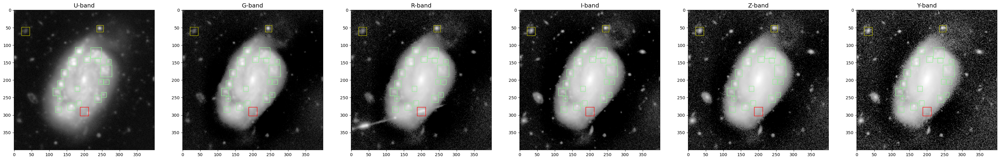

In [11]:
# we're using six images, one for each filterband
bands = 'UGRIZY'

# let's pick one galaxy using the HSC-catalogue ID
objid = 37489395137269668

fig, ax = plt.subplots(1, len(bands), figsize=(7*len(bands),7))

data = df_training_data_UGRIZY[(df_training_data_UGRIZY['local_id']==objid)]

for i, band in enumerate(bands):
    ax[i].set_title('{}-band'.format(band), fontsize = 14)
    # the image files are named using the object-ID and a suffix for the filterband
    HSC_img = matplotlib.image.imread(IMAGE_DATA_PATH + 'HSC_CLAUDS_train_set_wide_6channel_images/' + str(objid) + '_{}.png'.format(band))
    ax[i].imshow(HSC_img, cmap='Greys_r')
    
    # we're using the normalised coordinates of the bounding boxes but need the full extent of the image first
    x, y = HSC_img.shape

    if len(data) > 0:
        for idx, dat in data.iterrows():
            cl = box_colour[dat['label']]
            rect_hsc = matplotlib.patches.Rectangle(
                (int(dat['px_x1_normed']*x), int(dat['px_y1_normed']*y)),
                int(dat['px_x2_normed']*x - dat['px_x1_normed']*x), int(dat['px_y2_normed']*y - dat['px_y1_normed']*y),
                facecolor='None', 
                edgecolor=cl,
                ls='-',
                linewidth=1,
            )
            ax[i].add_patch(rect_hsc)

and also for the Euclid dataset:

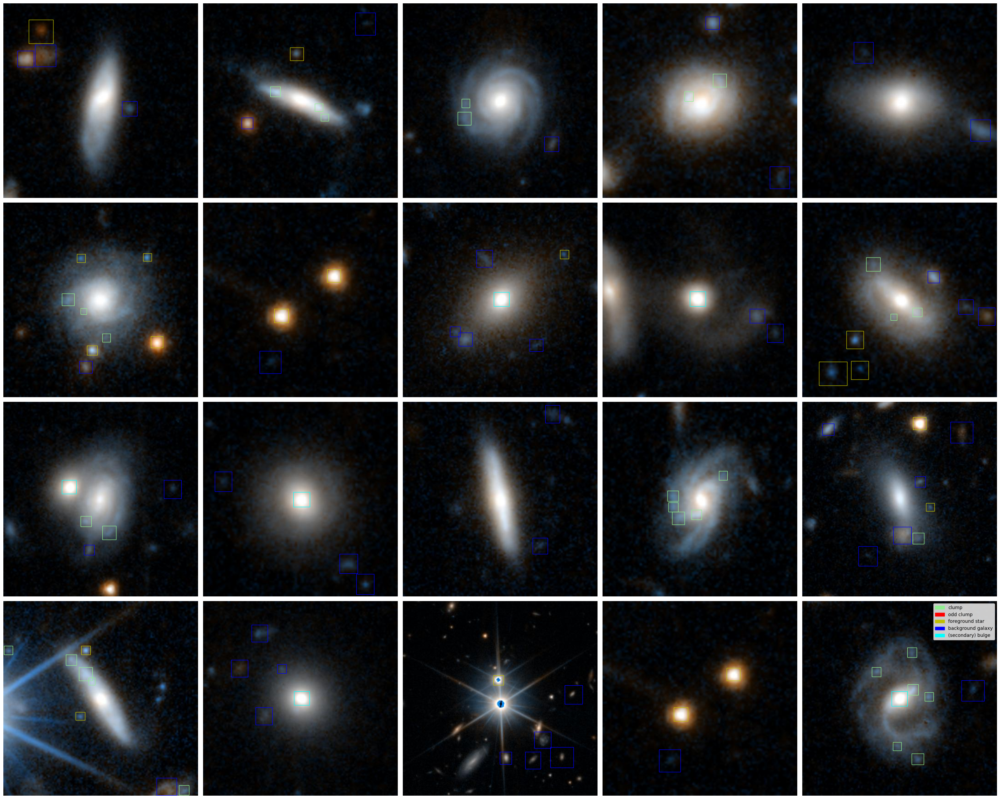

In [12]:
# randomly pick some 20 galaxies
objids = np.random.choice(df_training_data_Euclid['local_id'].unique(), 20)

N = len(objids)//5

fig, axs = plt.subplots(N, 5, figsize=(30, N*6))
ax = axs.ravel()

for i, objid in enumerate(objids):
    data = df_training_data_Euclid[(df_training_data_Euclid['local_id']==objid)]
    img = matplotlib.image.imread(IMAGE_DATA_PATH + 'Euclid_train_images_424x424/resized_102022523_' + str(objid) + '.jpg')
    if len(data) > 0:
        for idx, dat in data.iterrows():
            rect_hsc = matplotlib.patches.Rectangle(
                (int(dat['x1']), int(dat['y1'])),
                int(dat['x2'] - dat['x1']), int(dat['y2'] - dat['y1']),
                facecolor='None', 
                edgecolor=box_colour[dat['label']],
                ls='-',
                linewidth=1,
            )
            ax[i].add_patch(rect_hsc)
    ax[i].imshow(img)
    ax[i].axis('off')

patches = [matplotlib.patches.Patch(color=value, label=label_name[key]) for key, value in box_colour.items()]

plt.legend(handles=patches)
plt.tight_layout()

The training dataset needs to be split into a training and validation set (if needed, you could also add a test set). Here, we will split the HSC/CLAUDS and Euclid datasets per galaxy (meaning `local_id`) and only using training and validation sets and add a new column to each of the dataframes:

In [13]:
# Train/Val sets HSC/CLAUDS
train_set, val_set = train_test_split(
    df_training_data_UGRIZY['local_id'].unique(), 
    test_size=0.2,
)

df_train = df_training_data_UGRIZY[df_training_data_UGRIZY['local_id'].isin(train_set)]
df_val = df_training_data_UGRIZY[df_training_data_UGRIZY['local_id'].isin(val_set)]

df_training_data_UGRIZY = (df_training_data_UGRIZY
    .assign(train_group = 'training')
    .assign(train_group = lambda _df: _df.train_group.where(_df.local_id.isin(train_set), 'validation'))
)

In [14]:
# Train/Val sets Euclid
train_set, val_set = train_test_split(
    df_training_data_Euclid['local_id'].unique(), 
    test_size=0.2,
)

df_train = df_training_data_Euclid[df_training_data_Euclid['local_id'].isin(train_set)]
df_val = df_training_data_Euclid[df_training_data_Euclid['local_id'].isin(val_set)]

df_training_data_Euclid = (df_training_data_Euclid
    .assign(train_group = 'training')
    .assign(train_group = lambda _df: _df.train_group.where(_df.local_id.isin(train_set), 'validation'))
)

Now, we need to prepare the datasets (images and bounding boxes) to be used for object detection model. We need a modified [dataset class](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset), a [data loader](https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) and a set of augmentation functions for the training data.

Below are two dataset classes, one for our single filterband case (HSC/CLAUDS) that requires a stack of six images, and one for the RGB-composite case (Euclid) that has three channels combined in a single JPEG-file (PNG should also work). 

Both classes stack the separate channels of the input image(s) into a tensor and attach the bounding box coordinates plus labels to it. The reference to the physical image file(s) differ for both classes. I named the HSC/CLAUDS images based on their object-ID and filterband, so the image filename can be simply constructed from both values for each object. The Euclid image files are named differently but we want to cover the case in this example when image filenames cannot be constructed simply from an object-ID, so the image filename needs to be stored in our dataframe with the training data.

Before defining the dataset classes, let's quickly add a new column to the Euclid training dataframe with the image filename:

In [15]:
df_training_data_Euclid = (df_training_data_Euclid
    .assign(local_file = lambda _df: 'resized_102022523_' + _df.local_id.astype(str) + '.jpg')
)

In [16]:
class SingleFilterbandDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, image_dir, bands='UIRGZY', transforms=None):
        # super().__init__()
        self.df = dataframe
        self.image_dir = image_dir
        self.bands = bands
        self.transforms = transforms
        self.image_ids = dataframe['local_id'].unique()
        
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['local_id'] == image_id]

        file_names = {band: self.image_dir + str(image_id) + '_{}.png'.format(band) for band in self.bands}
        image_arrays = [PIL.Image.open(file_names[band]).convert('L') for band in self.bands]

        image = tv_tensors.Image(np.stack(image_arrays, axis=0))
        
        # Handle empty bounding boxes
        boxes = records[['x1', 'y1', 'x2', 'y2']].values
        if np.isnan(boxes).all():
            boxes = torch.zeros((0, 4), dtype=torch.float32)
        else:
            boxes = torch.as_tensor(boxes,dtype=torch.float32)
        
        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format=tv_tensors.BoundingBoxFormat.XYXY,
            canvas_size=image.shape[-2:]
        )
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        # there is only one class supported
        # labels = torch.ones((records.shape[0], ), dtype=torch.int64)
        labels_list = records[['label']].values
        labels = torch.as_tensor(labels_list, dtype=torch.int64)
        labels = torch.squeeze(labels, 1)
        
        # no crowd instances
        iscrowd = torch.zeros((records.shape[0], ), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([image_id])
        target['area'] = area
        target['iscrowd'] = iscrowd

        if self.transforms is not None:
            image, target = self.transforms(image, target)

        return image, target

    def __len__(self) -> int:
        return self.image_ids.shape[0]



class EuclidDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        # super().__init__()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.image_ids = dataframe['local_id'].unique()
        self.image_filenames = dataframe['local_file'].unique()
        
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image_filename = self.image_filenames[index]
        records = self.df[self.df['local_id'] == image_id]

        image = PIL.Image.open(self.image_dir + image_filename).convert('RGB')
        image = tv_tensors.Image(image)
        
        # Handle empty bounding boxes
        boxes = records[['x1', 'y1', 'x2', 'y2']].values
        if np.isnan(boxes).all():
            boxes = torch.zeros((0, 4), dtype=torch.float32)
        else:
            boxes = torch.as_tensor(boxes,dtype=torch.float32)
        
        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format=tv_tensors.BoundingBoxFormat.XYXY,
            canvas_size=image.shape[-2:]
        )
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        # there is only one class supported
        # labels = torch.ones((records.shape[0], ), dtype=torch.int64)
        labels_list = records[['label']].values
        labels = torch.as_tensor(labels_list, dtype=torch.int64)
        labels = torch.squeeze(labels, 1)
        
        # no crowd instances
        iscrowd = torch.zeros((records.shape[0], ), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([image_id])
        target['area'] = area
        target['iscrowd'] = iscrowd

        if self.transforms is not None:
            image, target = self.transforms(image, target)

        return image, target

    def __len__(self) -> int:
        return self.image_ids.shape[0]

The dataset classes can be initialised with a list of image augmentation functions. In our cases we want randomly flipped images for the training run. These image transformation or augmentation functions are only applied to the train data set, not the validation. Some general transforms are applied to both, train and validation, and are mainly to ensure that they are a proper tensor with the right data type.

There are more transformation or augmentation functions available from `torchvision.transforms`, and these can be added here if needed.

In [17]:
def get_transform(train):
    transforms = []

    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
        transforms.append(T.RandomVerticalFlip(0.5))

    transforms.append(T.PILToTensor())
    transforms.append(T.ConvertImageDtype(torch.float))

    return T.Compose(transforms)

Then we define the data loader for which we use our dataframe with the labeled boxes, the directory with the images, the filterbands used as a string (only for the HSC/CLAUDS dataset) and our transform/augmentation functions from above.

The function below returns a dictionary containing a dataloader for the train and validation set.

First, for the HSC/CLAUDS dataset again, because here we need to iterate over the six filterbands `'UGRIZY'`:

In [18]:
def get_dataloader_dict_UGRIZY(train_df, val_df, image_dir, bands, batch_size):
    image_datasets = {}

    image_datasets['train'] = SingleFilterbandDataset(
        dataframe=train_df,
        image_dir=image_dir,
        bands=bands,
        transforms=get_transform(train=True)
    )
    
    image_datasets['val'] = SingleFilterbandDataset(
        dataframe=val_df,
        image_dir=image_dir,
        bands=bands,
        transforms=get_transform(train=False)
    )
    
    return {x: torch.utils.data.DataLoader(
        image_datasets[x], 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=0,
        pin_memory=torch.cuda.is_available(),
        collate_fn=utils.collate_fn,
    ) for x in ['train', 'val']}

Then for the Euclid dataset, for which we don't need to specify any filterband list as we are using RGB-composites.

In [19]:
def get_dataloader_dict_Euclid(train_df, val_df, image_dir, batch_size):
    image_datasets = {}

    image_datasets['train'] = EuclidDataset(
        dataframe=train_df,
        image_dir=image_dir,
        transforms=get_transform(train=True)
    )
    
    image_datasets['val'] = EuclidDataset(
        dataframe=val_df,
        image_dir=image_dir,
        transforms=get_transform(train=False)
    )
    
    return {x: torch.utils.data.DataLoader(
        image_datasets[x], 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=0,
        pin_memory=torch.cuda.is_available(),
        collate_fn=utils.collate_fn,
    ) for x in ['train', 'val']}

Now, let's test if the data loader is working.

In [20]:
# Test dataloader HSC/CLAUDS
dataloader_dict_UGRIZY = get_dataloader_dict_UGRIZY(
    train_df=df_training_data_UGRIZY[(df_training_data_UGRIZY['train_group']=='training')],
    val_df=df_training_data_UGRIZY[(df_training_data_UGRIZY['train_group']=='validation')],
    image_dir=IMAGE_DATA_PATH + 'HSC_CLAUDS_train_set_wide_6channel_images/',
    bands='UIRGZY',
    batch_size=1
)

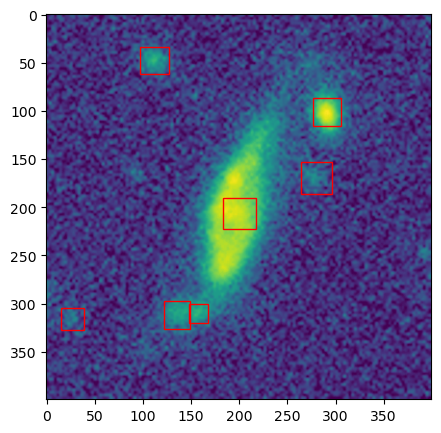

In [21]:
images, targets = next(iter(dataloader_dict_UGRIZY['train']))
images = list(img.to(TORCH_DEVICE) for img in images)
targets = [{k: v.to(TORCH_DEVICE) for k, v in t.items()} for t in targets]

for i in range(1):
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = PIL.Image.fromarray((images[i][0].cpu().numpy() * 255)).convert('L')
    plt.figure(figsize=(5, 5))
    
    for box in boxes:
        rect_hsc = matplotlib.patches.Rectangle(
            (box[0], box[1]),
            box[2]-box[0], box[3]-box[1],
            facecolor='None', 
            edgecolor='r',
            ls='-',
            linewidth=1,
        )
        plt.gca().add_patch(rect_hsc)

    plt.imshow(sample)
    # plt.axis('off')

In [22]:
# Test dataloader Euclid
dataloader_dict_Euclid = get_dataloader_dict_Euclid(
    train_df=df_training_data_Euclid[(df_training_data_Euclid['train_group']=='training')],
    val_df=df_training_data_Euclid[(df_training_data_Euclid['train_group']=='validation')],
    image_dir=IMAGE_DATA_PATH + 'Euclid_train_images_424x424/',
    batch_size=1
)

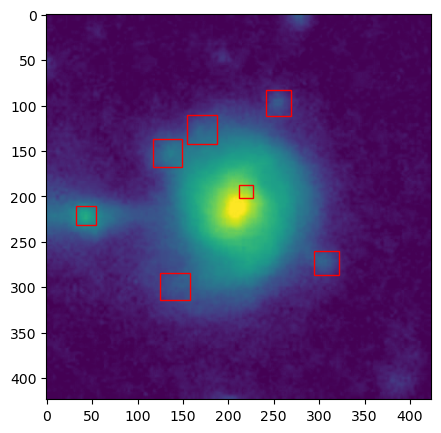

In [27]:
images, targets = next(iter(dataloader_dict_Euclid['train']))
images = list(img.to(TORCH_DEVICE) for img in images)
targets = [{k: v.to(TORCH_DEVICE) for k, v in t.items()} for t in targets]

for i in range(1):
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = PIL.Image.fromarray((images[i][0].cpu().numpy() * 255)).convert('L')
    plt.figure(figsize=(5, 5))
    
    for box in boxes:
        rect_hsc = matplotlib.patches.Rectangle(
            (box[0], box[1]),
            box[2]-box[0], box[3]-box[1],
            facecolor='None', 
            edgecolor='r',
            ls='-',
            linewidth=1,
        )
        plt.gca().add_patch(rect_hsc)

    plt.imshow(sample)
    # plt.axis('off')

Looks good? Then we can move on to setting up the object detection model.

# Defining the model

Our object detection model will be using the Faster R-CNN architecture with ResNet50 feature layers or blocks as its classification backbone. I am using here ResNet as a backbone as described in the original [paper](https://arxiv.org/abs/1506.01497) with a feature pyramide network (FPN) on top. Technically, it should be possible to take any CNN as a backbone, e.g. EfficientNet, and it would be worth exploring the performance of different CNN-architectures in combination with Faster R-CNN.

The principle architecture of ResNet50, ResNet100 or other variation is shown in this image:

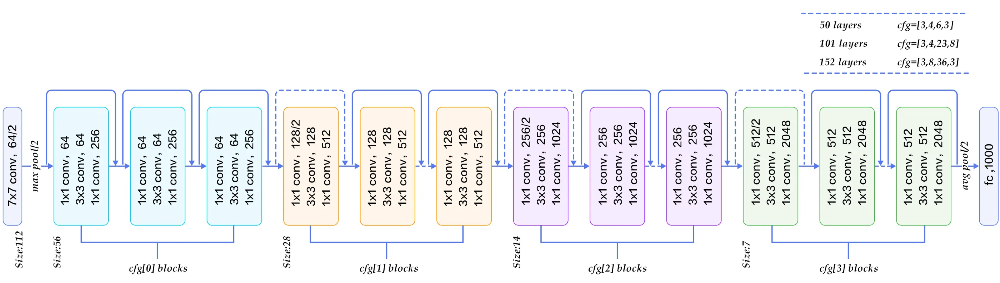

For our Faster R-CNN model we're simply cutting out the four convolutional blocks with their weights and add a FPN at the end. More importantly is what pre-trained ResNet50-CNN we're choosing for our object detection task. The model classes below can be initialised either with
1. random weights (plain, untrained ResNet)
2. terrestrial pretraining (e.g. ImageNet)
3. astronomical pretraining (Zoobot)

The terrestrial weights are coming with the Pytorch library whereas Zoobot is directly loaded from the HuggingFace repo (so you need `timm` installed and loaded).

Again, there are examples for our two science cases. Terrestrial image classifiers and also Zoobot are built and trained on 3-channel input images (RGB). For our Euclid dataset we have also three input channels and not too much modification is required. The HSC/CLAUDS date, on the other hand, has six channels, the UGRIZY filterbands. For this case we need to expand the first convolutional layer to accomodate a 6-channel input. This is not a problem but we don't have any weights from the pretrained backbone, yet. So we need to copy the existing weights from the original first convolutional layer onto the added input channels of our new convolutional layer.

Then, we define a function which actually initialises the model and add some more parameters (e.g. mean and standard deviation of all the pixel values in the images) and offers an option to unfreeze or freeze specific convolutional blocks of the feature extraction backbone. This option allows for different levels of fine-tuning, setting either the last, second to last, second, first block or even the first convolution layer free to be trained. For a simple transfer learning approach, all blocks would be set to be fixed and their weights freezed.

Very important for initialising the model is the number of classes the model should also try to identify. In our case we have two classes for clumps ('normal' and 'odd') and three classes for contaminations or non-clump objects, plus the required class for the background, giving us six classes in total.

Let's start with the model class for the HSC/CLAUDS data which requires a 6-channel input and the first conv-layer needs to be expanded.

In [28]:
# Faster R-CNN with 6 channels
class Resnet50WithFPN_UGRIZY(torch.nn.Module):
    def __init__(self, weights):
        super(Resnet50WithFPN_UGRIZY, self).__init__()

        self.weights = weights

        if self.weights is not None:
            if self.weights == 'Zoobot':
                m = timm.create_model('hf_hub:mwalmsley/zoobot-encoder-resnet50', pretrained=True, num_classes=2)
            else:
                # e.g. weights='DEFAULT' or weights='IMAGENET1K_V1'
                m = torchvision.models.resnet50(weights=self.weights)
        else:
            m = torchvision.models.resnet50()
        
        # adjust the very first layer of the model
        # we need 6 instead of the standard three input channels
        # 1. copy the existing weights
        weight = m.conv1.weight.clone()
        # 2. make a new conv-layer with 6 input channels
        m.conv1 = nn.Conv2d(6, 64, kernel_size=7, stride=2, padding=3, bias=False)
        # copy back the original weights and duplicate some channel weights for the remaining channels
        # The idea in this example is, that we want a model to take in UGRIZY-data and Zoobot is trained on GRI-data. 
        # So we copy the weights from G (previously the 1st channel but we move G to be the 2nd channel) to U (now the 1st channel),
        # move R and I to the 3rd and 4th channel, respectively, and finally copy the I-channel (now 4th channel) to 
        # the Z (5th channel) and Y (6th channel). This should give us at least a good starting point for training the model
        # as we don't have any other information/weights, yet.
        with torch.no_grad():
            m.conv1.weight[:, 1:4] = weight
            m.conv1.weight[:, 0] = m.conv1.weight[:, 1] # copies the weights for the 2nd channel to the 1st channel
            m.conv1.weight[:, 4] = m.conv1.weight[:, 3] # copies the weights for the 4th channel to the 5th channel
            m.conv1.weight[:, 5] = m.conv1.weight[:, 3] # copies the weights for the 4th channel to the 6th channel

        # Extract 4 main layers (note: FRCNN needs this particular name mapping for return nodes)
        self.body = create_feature_extractor(
            m,
            return_nodes={f'layer{k}': str(v) for v, k in enumerate([1, 2, 3, 4])}
        )
        
        # Dry run to get number of channels for FPN
        inp = torch.randn(2, 6, 224, 224)
        # inp = inp.to(TORCH_DEVICE)
        
        with torch.no_grad():
            out = self.body(inp)
        in_channels_list = [o.shape[1] for o in out.values()]
        
        # Build FPN
        self.out_channels = 256
        self.fpn = FeaturePyramidNetwork(
            in_channels_list, out_channels=self.out_channels,
            extra_blocks=LastLevelMaxPool())

    def forward(self, x):
        x = self.body(x)
        x = self.fpn(x)
        return x

The Euclid model class is very similar but does not require a change to the first conv-layer.

In [29]:
# Faster R-CNN with 6 channels
class Resnet50WithFPN_Euclid(torch.nn.Module):
    def __init__(self, weights):
        super(Resnet50WithFPN_Euclid, self).__init__()

        self.weights = weights

        if self.weights is not None:
            if self.weights == 'Zoobot':
                m = timm.create_model('hf_hub:mwalmsley/zoobot-encoder-resnet50', pretrained=True, num_classes=2)
            else:
                # e.g. weights='DEFAULT' or weights='IMAGENET1K_V1'
                m = torchvision.models.resnet50(weights=self.weights)
        else:
            m = torchvision.models.resnet50()

        # Extract 4 main layers (note: FRCNN needs this particular name mapping for return nodes)
        self.body = create_feature_extractor(
            m,
            return_nodes={f'layer{k}': str(v) for v, k in enumerate([1, 2, 3, 4])}
        )
        
        # Dry run to get number of channels for FPN
        inp = torch.randn(2, 3, 224, 224)
        # inp = inp.to(TORCH_DEVICE)
        
        with torch.no_grad():
            out = self.body(inp)
        in_channels_list = [o.shape[1] for o in out.values()]
        
        # Build FPN
        self.out_channels = 256
        self.fpn = FeaturePyramidNetwork(
            in_channels_list, out_channels=self.out_channels,
            extra_blocks=LastLevelMaxPool())

    def forward(self, x):
        x = self.body(x)
        x = self.fpn(x)
        return x

And here is an example of function which initalises the final model. Note, that it is almost the same for both models, the HSC/CLAUDS and Euclid model, and only differs in the model class used. We could add another parameter for that, but I simply commented  the HSC/CLAUDS model out as we will continue with only the Euclid case from now on.

As you can see, there is also an option to load custom pretrained weights through a saved checkpoint. Also, we redefine the transform layer to better fit our needs, especially the mean and std.dev. values for the image pixels used for normalising the images. The settings for `min_size` and `max_size` ensure, that images outside this range are rescaled to match the required input size.

In [30]:
def get_model(
        ckpt, 
        device,
        weights,
        num_classes, 
        trainable_layers, 
        image_mean, 
        image_std
    ):
    """
    Creates the model object for Faster R-CNN

    Args:
      ckpt (str) : path to checkpoint with custom pretrained weights
      device (torch.device or str) : torch device
      weights (str or None) : pretrained weights for the ResNet50 backbone, either 'Zoobot' for loading the Zoobot ResNet50 model
        from HuggingFace, a PyTorch weight set for ResNet50 'DEFAULT' or 'IMAGENET1K_V1', or None
        (see here for pretrained weights for ResNet50: https://pytorch.org/vision/main/models/generated/torchvision.models.resnet50.html#torchvision.models.resnet50)
      num_classes (int) : number of classes the detector should output, must include a class for the background
      trainable_layers (int) : number of blocks of the classification backbone,
        counted from top, that should be made trainable
        e.g. 0 - all blocks fixed, 5 - all blocks and incl. 'backbone.body.conv1' trainable
      image_mean (list of floats) : mean of the pixel values for each image filter or channel
      image_std (list of floats) : standard deviation of the pixel values for each image filter or channel

    Returns:
      Faster R-CNN model
    """

    # Build the model
    # HSC/CLAUDS - 6-channel input model
    # model = FasterRCNN(Resnet50WithFPN_UGRIZY(weights=weights), num_classes=num_classes)
    # Euclid - 3-channel input model
    model = FasterRCNN(Resnet50WithFPN_Euclid(weights=weights), num_classes=num_classes)

    # load checkpoint, model_type 'Zoobot' or 'FRCNN-Zoobot'
    if ckpt is not None:
        model.load_state_dict(torch.load(
            ckpt,
            map_location=torch.device(device)
        ))

    # change the Transform layer to fit for single channel images
    grcnn = GeneralizedRCNNTransform(
        min_size=300, 
        max_size=1333, 
        image_mean=image_mean, 
        image_std=image_std
    )
    model.transform = grcnn

    # make sure, backbone layers are freezed after creating the model
    for name, parameter in model.named_parameters():
        if name.startswith('backbone.body.'):
            parameter.requires_grad = False
    
    # unfreeze selected layers
    if trainable_layers < 0 or trainable_layers > 5:
        raise ValueError(f"Trainable layers should be in the range [0, 5], got {trainable_layers}")
    
    layers_to_train = [
        'backbone.body.layer4', 
        'backbone.body.layer3', 
        'backbone.body.layer2', 
        'backbone.body.layer1', 
        'backbone.body.conv1'
    ][:trainable_layers]
    
    if trainable_layers == 5:
        layers_to_train.append('backbone.body.bn1')

    for layer in layers_to_train:
        for name, parameter in model.named_parameters():
            if name.startswith(layer):
                parameter.requires_grad_(True)

    return model

We're now calling the `get_model` function with Zoobot as the classification backbone, six classes and want to have a model for transfer learning, meaning we're fixing all convolutional block, not allowing them to be trained. Image mean and standard deviation are measured from set of images and will differ for other datasets.

In [ ]:
# generate the model
frcnn_model = get_model(
    ckpt=None,
    device=TORCH_DEVICE,
    weights='Zoobot',
    num_classes=6,
    trainable_layers=0,
    image_mean = [
        0.2030106633901596,
        0.18999557197093964,
        0.15771611034870148
    ],
    image_std = [
        0.18111662566661835,
        0.169032022356987,
        0.14121027290821075
    ], 
)

Let's print the model structure and then we're ready to start training the model:

In [ ]:
frcnn_model

# Model training

Now that we have a model and training data, we can start the training loop. There are many things you could change and implement differently, but this demonstration should provide at least one working bit of code. One different implementation could make use of the [Pytorch Lightning](https://lightning.ai/docs/pytorch/stable/) framework, so no separate logging of the training and validation loss is needed. Or the train loop could be just another method of the model class.

Also, parallisation is still using `DataParallel` which has been replaced by other methods. So many more things to explore here.

In [33]:
# initialise Tensorboard writer for saving loss, etc. per iteration
tb_log_dir = MODEL_OUTPUT_PATH + 'logs_train/'
writer = SummaryWriter(log_dir=tb_log_dir)

In [ ]:
# move model to the right device and using all available GPUs
frcnn_model = nn.DataParallel(frcnn_model)
frcnn_model.to(TORCH_DEVICE)

In [35]:
# construct an optimizer
# Adam is used in this case
params = [p for p in frcnn_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0001, weight_decay=0.00005)

We define a few variables for the training loop. All these parameters could also be easily read via a config file for a stand-alone python script.

In [36]:
# define a batch size
batch_size = 4

In [37]:
# number of epochs the model should be trained
# 1 epoch is certainly not enough but is used to simply test the training loop
epochs = 1

In [38]:
# load data
dataloader_dict_Euclid = get_dataloader_dict_Euclid(
    train_df=df_training_data_Euclid[(df_training_data_Euclid['train_group']=='training')],
    val_df=df_training_data_Euclid[(df_training_data_Euclid['train_group']=='validation')],
    image_dir=IMAGE_DATA_PATH + 'Euclid_train_images_424x424/',
    batch_size=batch_size
)

In [45]:
# let's train
for epoch in range(epochs):
    # train for one epoch, printing every 10 iterations
    engine.train_one_epoch(
        frcnn_model, 
        optimizer, 
        dataloader_dict_Euclid['train'], 
        device=TORCH_DEVICE, 
        epoch=epoch, 
        print_freq=10,
        scaler=None,
        tb_writer=writer
        # tb_writer=None
    )

    # update the learning rate for other optimizer than Adam
    # lr_scheduler.step()

    engine.evaluate_loss(
        frcnn_model, 
        dataloader_dict_Euclid['val'], 
        device=TORCH_DEVICE, 
        epoch=epoch, 
        tb_writer=writer
        # tb_writer=None
    )

    # evaluate on the test dataset
    engine.evaluate(
        frcnn_model, 
        dataloader_dict_Euclid['val'], 
        device=TORCH_DEVICE,
        epoch=epoch, 
        tb_writer=writer
        # tb_writer=None
    )
    
    # save model for each epoch
    model_save_path = MODEL_OUTPUT_PATH + 'FRCNN_epoch_{}.pth'.format(epoch)
    torch.save(frcnn_model.state_dict(), model_save_path)

Epoch: [0]  [ 0/81]  eta: 0:04:06  lr: 0.000000  loss: 2.7616 (2.7616)  loss_classifier: 1.5288 (1.5288)  loss_box_reg: 0.0307 (0.0307)  loss_objectness: 0.6964 (0.6964)  loss_rpn_box_reg: 0.5057 (0.5057)  time: 3.0413  data: 0.0263
Epoch: [0]  [10/81]  eta: 0:03:08  lr: 0.000000  loss: 2.6173 (2.6358)  loss_classifier: 1.5279 (1.5290)  loss_box_reg: 0.0227 (0.0253)  loss_objectness: 0.6942 (0.6914)  loss_rpn_box_reg: 0.3879 (0.3901)  time: 2.6538  data: 0.0133
Epoch: [0]  [20/81]  eta: 0:02:41  lr: 0.000000  loss: 2.6442 (2.6765)  loss_classifier: 1.5279 (1.5290)  loss_box_reg: 0.0225 (0.0243)  loss_objectness: 0.6927 (0.6927)  loss_rpn_box_reg: 0.4068 (0.4305)  time: 2.6313  data: 0.0123
Epoch: [0]  [30/81]  eta: 0:02:18  lr: 0.000000  loss: 2.6890 (2.6613)  loss_classifier: 1.5283 (1.5292)  loss_box_reg: 0.0225 (0.0241)  loss_objectness: 0.6927 (0.6923)  loss_rpn_box_reg: 0.4362 (0.4157)  time: 2.7546  data: 0.0119
Epoch: [0]  [40/81]  eta: 0:01:52  lr: 0.000000  loss: 2.6192 (2.654

After training we want to examine the training and validation loss and other object detection related performance parameters. Based on the F1-score, we want to decide at which epoch our model shows the best performance (or highest F1-score) and take the corresponding checkpoint as our final model weights.

The F1-score is defined as:
$$F1 = 2 \times (\rm{precision} \times \rm{recall}) / (\rm{precision} + \rm{recall})$$

The F1-score is only one metric to assess the model performance. Other criteria, like the epoch when the validation loss starts increasing again and the model starts to show signs of overfitting, should also be considered here and depend on the specific science case.

We're reading and parsing the log-file(s) from the Tensorboard Writer and extract all the metrics we need. Some metrics are written out not only at every epoch but also for each iteration step in between. For that we define a list of metrics for which values are recorded per step instead of epoch. Then we create a dataframe for all metrics, plot the training and validation loss per epoch and calculate the F1-score.

In [47]:
# reading the tensorboard logs
# output folder of the logs is already defined in tb_log_dir above

log_data = []

if os.path.exists(tb_log_dir):
    log_file = [f for f in os.listdir(tb_log_dir) if os.path.isfile(os.path.join(tb_log_dir, f))]
    try:
        for e in summary_iterator(tb_log_dir+log_file[0]):
            for v in e.summary.value:
                log_data.append([
                    e.step,
                    v.tag, # name of scalar
                    v.simple_value, # value of scalar
                ])
        # print('SUCCESS - Event file loaded: {}'.format(log_path+log_file[0]))
    except:
        print('ERROR - Event file is possibly corrupt: {}'.format(tb_log_dir+log_file[0]))

In [48]:
scalars_with_steps = [
    'Training/Loss', 
    'Training/Loss_box_reg',
    'Training/Loss_classifier', 
    'Training/Loss_objectness',
    'Training/Loss_rpn_box_reg',
    'LR/Learning_rate'
]

In [49]:
cols = [
    'step',
    'scalar_name',
    'scalar_value',
]

df = pd.DataFrame(log_data, columns=cols)

In [50]:
step_max = df[df['scalar_name']=='Training/Loss']['step'].max()
epochs = df[df['scalar_name']=='Validation/Loss']['step'].max() + 1
step_size = step_max // epochs

df = (df
    .assign(epoch = lambda _df: (np.ceil(_df.step/step_size)).astype(int))
    .assign(epoch = lambda _df: _df.epoch.where(_df.scalar_name.isin(scalars_with_steps), _df.step))
    .assign(epoch=lambda df_: df_.epoch.where(df_.scalar_name.isin(scalars_with_steps), df_.epoch+1))
)

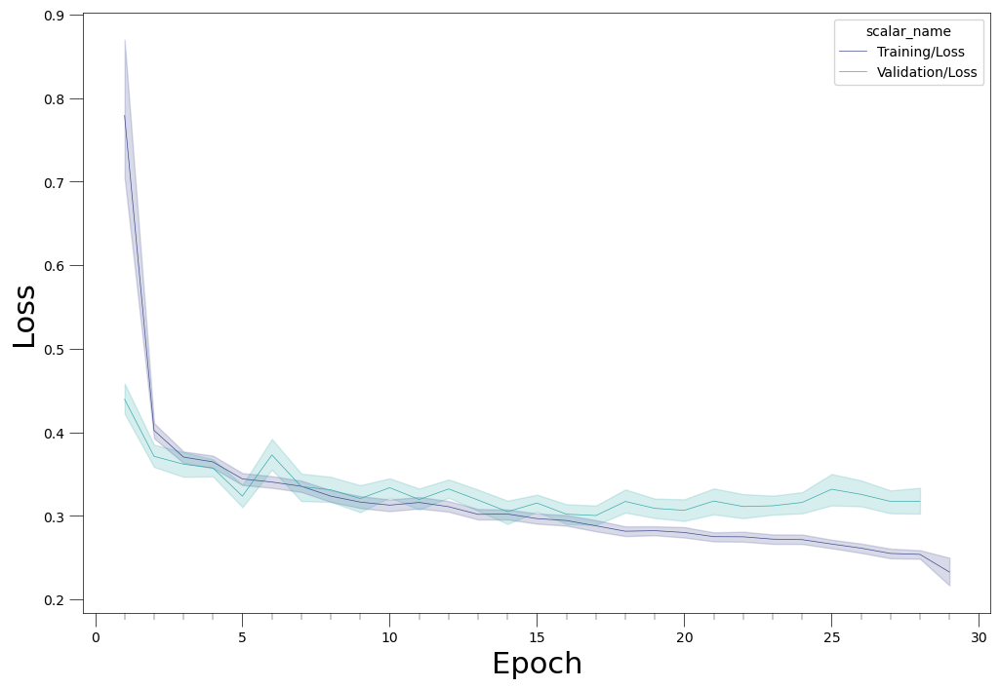

In [51]:
# plot loss: train vs. validation
palette = sns.color_palette('mako', 2)
scalar_names = ['Training/Loss', 'Validation/Loss']

df_plot = df[(df['scalar_name'].isin(scalar_names))]

f, ax = plt.subplots(figsize=(12, 8))

p = sns.lineplot(
    x='epoch', 
    y='scalar_value', 
    hue='scalar_name',
    style='scalar_name',
    markers=False, 
    dashes=False,
    palette=palette,
    legend='full',
    # alpha=0.8,
    linewidth=.5,
    data=df_plot
)

p.set_xlabel('Epoch', fontsize=22)
p.set_ylabel('Loss', fontsize=22)
plt.setp(ax.spines.values(), linewidth=.5)
# ax.set_xlim(0, 50)
ax.tick_params('both', length=10, width=.5, which='major')
ax.tick_params('both', length=5, width=.3, which='minor')
ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(1.))
# ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.005))

In [52]:
# F1-score
df_best = df[(df['scalar_name'].isin(['AR/IoU/0.50-0.95/all/10', 'AP/IoU/0.50-0.95/all/100']))]
df_f1 = df_best.pivot(index=['step'], columns='scalar_name', values='scalar_value').reset_index()

# F1 = 2 * (precision * recall) / (precision + recall)
df_f1['f1_score'] = 2 * (df_f1['AP/IoU/0.50-0.95/all/100'] * df_f1['AR/IoU/0.50-0.95/all/10']) / (df_f1['AP/IoU/0.50-0.95/all/100'] + df_f1['AR/IoU/0.50-0.95/all/10'])

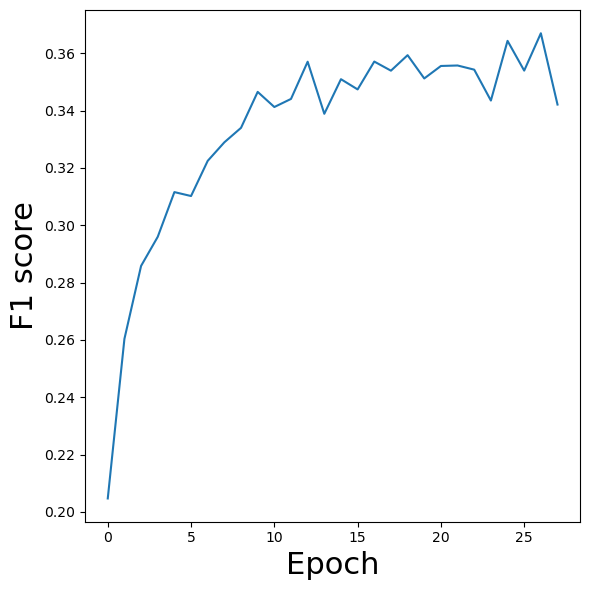

In [53]:
f, ax = plt.subplots(figsize=(6, 6))

p = sns.lineplot(
    x='step', 
    y='f1_score', 
    markers=False, 
    dashes=False,
    legend='full',
    data=df_f1
)

p.set_xlabel('Epoch', fontsize=22)
p.set_ylabel('F1 score', fontsize=22)
plt.tight_layout()

In our example for the Euclid model, the F1-score is highest for epoch=26. So we keep this model checkpoint, copy it into the folder `./model/` as `FRCNN_epoch_26.pth` and use these weights for making predictions on new galaxy images in the next step.

# Predict

After the model is trained we can use it to make predictions on new galaxy images. A simple prediction on a single image can be done by 

`outputs = frcnn_model(image)`

In this demonstration we want to make predictions on many images and save the result as a Pandas dataframe. We will start fresh, assuming this would be a separate script that does not have the model object from above but needs to build it from the final checkpoint. Then we also need the data loader again to iterate through all the images. The data loader needs some list of all the images we want to feed to our model to make predictions. I will reuse our train dataframe for that but such a list could also come from reading the filenames of all images in a specific folder, etc.

Please note, that we're actually doing predictions on the images the model has been trained on. We would not have to do that since we have object markings and labels already for all the galaxy images, but I simply want to demonstrate how predictions can be done.

In [ ]:
# set the location of the final or best model checkpoint
model_ckpt_path = MODEL_OUTPUT_PATH + 'FRCNN_epoch_26.pth'

# generate the model
frcnn_model = get_model(
    ckpt=None,
    device=TORCH_DEVICE,
    weights='Zoobot',
    num_classes=6,
    trainable_layers=0,
    image_mean = [
        0.2030106633901596,
        0.18999557197093964,
        0.15771611034870148
    ],
    image_std = [
        0.18111662566661835,
        0.169032022356987,
        0.14121027290821075
    ], 
)

# move model to the right device and using all available GPUs
frcnn_model = nn.DataParallel(frcnn_model)
frcnn_model.to(TORCH_DEVICE)

# load checkpoint
frcnn_model.load_state_dict(torch.load(
    model_ckpt_path,
    map_location=torch.device(TORCH_DEVICE)
))

# put the model in evaluation mode
frcnn_model.eval()

In [55]:
# load our training dataframe which we need to iterate through all the images
df = (pd
    .read_parquet(DATA_PATH + 'Euclid_train_set.gzip', engine='pyarrow')
    .assign(local_file = lambda _df: 'resized_102022523_' + _df.local_id.astype(str) + '.jpg')
    [['local_id', 'local_file']]
    .drop_duplicates()
    .assign(label = np.nan)
    .assign(label_text = '')
    .assign(x1 = np.nan)
    .assign(x2 = np.nan)
    .assign(y1 = np.nan)
    .assign(y2 = np.nan)
)

In [56]:
# load data
# we don't care about train and val set anymore at this stage but we're reusing the previously defined function
# note, that batch_size needs to be set to 1 for inference
dataloader_dict_Euclid = get_dataloader_dict_Euclid(
    train_df=df,
    val_df=df,
    image_dir=IMAGE_DATA_PATH + 'Euclid_train_images_424x424/',
    batch_size=1
)

In [ ]:
# initialise result-list
results = []

# start making predictions
for images, targets in tqdm.tqdm(dataloader_dict_Euclid['val']):
    images = list(img.to(TORCH_DEVICE) for img in images)

    if torch.cuda.is_available():
        torch.cuda.synchronize()
    
    outputs = frcnn_model(images)
    outputs = [{k: v.to(TORCH_DEVICE) for k, v in t.items()} for t in outputs]

    with torch.no_grad():
        res = {target['image_id'].item(): output for target, output in zip(targets, outputs)}

        for k, v in res.items():
            results.append([
                k,
                v['boxes'].data.cpu().numpy(),
                v['labels'].data.cpu().numpy(),
                v['scores'].data.cpu().numpy()
            ])

df_results = (
    pd.DataFrame(
        results, 
        columns=['local_ids', 'boxes', 'labels', 'scores']
        )
    .explode(['boxes', 'labels', 'scores'])
    .dropna() # removing non-detections
    .assign(labels = lambda df_: df_.labels.astype(int))
    .assign(scores = lambda df_: df_.scores.astype(float))
)
# save results
df_results.to_parquet(PREDICTIONS_FILE_PATH + 'preds_Zoobot-FRCNNbackbone_Euclid_test_raw.gzip')

100%|██████████| 403/403 [01:52<00:00,  3.59it/s]


# Post-processing

The raw result file still contains overlapping bounding boxes. Non-maximum suppression (NMS) is a method to keep only those bounding boxes which have the highest score attach from a set of overlapping bounding boxes. The degree of overlapping is defined by a Intersection-of-Union (IoU) threshold. We set this one here to 0.2. 

We also modify the results a bit and adding some convenience columns, normalised box coordinates for example.

In [57]:
# dictionary mapping input file to output file,
# add more key-values if you want to process more files in one go
pred_file_dict = {
    'preds_Zoobot-FRCNNbackbone_Euclid_test_raw.gzip': 'preds_Zoobot-FRCNNbackbone_Euclid_test_nms.gzip'
}

In [62]:
# Non-maximum suppression NMS
IOU_THRESHOLD = 0.2

for key, value in pred_file_dict.items():
    df_pred = pd.read_parquet(PREDICTIONS_FILE_PATH + key, engine='pyarrow')
    results = []
    
    _local_ids = df_pred['local_ids'].unique()
    for local_id in _local_ids:
        _df = df_pred[df_pred['local_ids'] == local_id]
        boxes = torch.from_numpy(np.vstack(_df['boxes'])).to(TORCH_DEVICE)
        labels = torch.tensor(_df['labels'].values, dtype=torch.int32).to(TORCH_DEVICE)
        scores = torch.tensor(_df['scores'].values, dtype=torch.float32).to(TORCH_DEVICE)
        keep = nms(boxes = boxes, scores = scores, iou_threshold=IOU_THRESHOLD)
        results.append([
            local_id, 
            boxes[keep].data.cpu().numpy(), 
            labels[keep].data.cpu().numpy(), 
            scores[keep].data.cpu().numpy()
        ])
    
    df_results = (
        pd.DataFrame(
            results, 
            columns=['local_ids', 'boxes', 'labels', 'scores']
            )
        .explode(['boxes', 'labels', 'scores'])
    )

    df_results[['px_x1', 'px_y1', 'px_x2', 'px_y2']] = pd.DataFrame(df_results['boxes'].tolist(), index= df_results.index)
    
    # aperture midpoints
    df_results['px_centre_x'] = (df_results['px_x1'] + df_results['px_x2']) / 2.0
    df_results['px_centre_y'] = (df_results['px_y1'] + df_results['px_y2']) / 2.0
    
    # normalised coords and filter out bulk markings
    df_results['px_x1_normed'] = df_results['px_x1'] / 424
    df_results['px_y1_normed'] = df_results['px_y1'] / 424
    df_results['px_x2_normed'] = df_results['px_x2'] / 424
    df_results['px_y2_normed'] = df_results['px_y2'] / 424
    
    df_results['is_central'] = (
        np.abs(0.5*(df_results['px_x2_normed'] + df_results['px_x1_normed']) - 0.5) < 0.02
        ) & (
        np.abs(0.5*(df_results['px_y2_normed'] + df_results['px_y1_normed']) - 0.5) < 0.02
        )
    
    df_results.to_parquet(PREDICTIONS_FILE_PATH + value, compression='gzip')
    print('Written NMS-cleaned file for {} to destination: {}'.format(key, PREDICTIONS_FILE_PATH + value))

Written NMS-cleaned file for preds_Zoobot-FRCNNbackbone_Euclid_test_raw.gzip to destination: ./predictions/preds_Zoobot-FRCNNbackbone_Euclid_test_nms.gzip


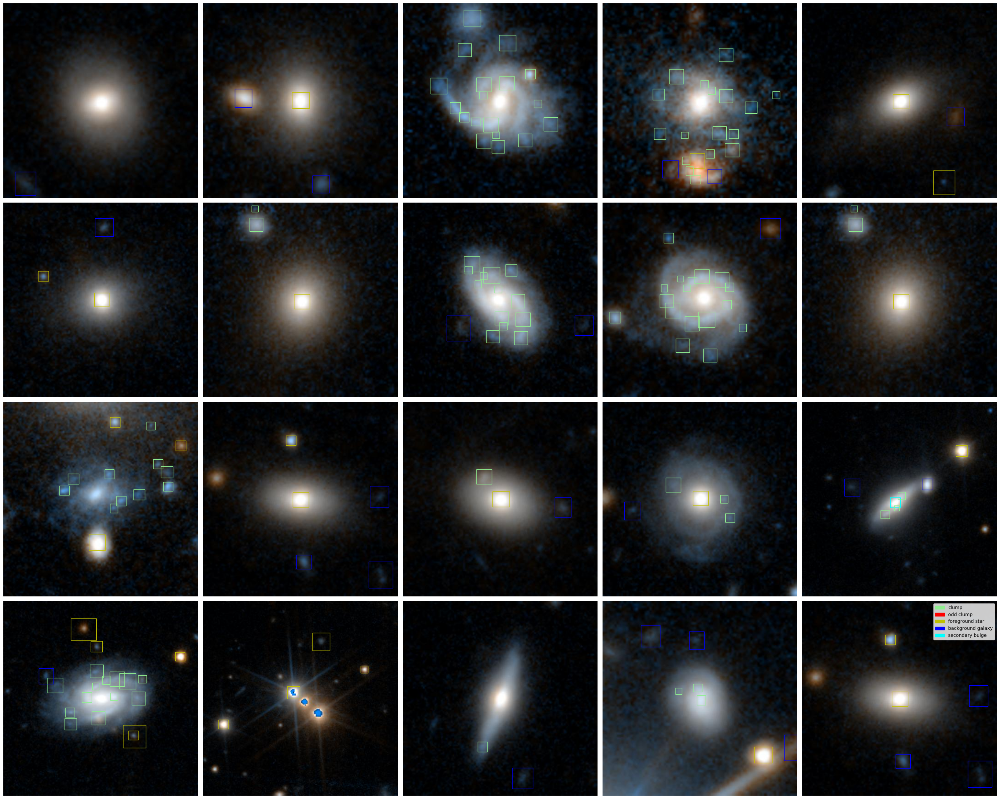

In [63]:
SCORE_THRESHOLD = 0.3

label_name = {
    1 : 'clump',
    2 : 'odd clump',
    3 : 'foreground star',
    4 : 'background galaxy',
    5 : 'secondary bulge',
}

box_colour = {
    1 : 'lightgreen',
    2 : 'r',
    3 : 'y',
    4 : 'blue',
    5 : 'cyan',
}

# randomly pick some 20 galaxies
objids = np.random.choice(df_results['local_ids'].unique(), 20)

N = len(objids)//5

fig, axs = plt.subplots(N, 5, figsize=(30, N*6))
ax = axs.ravel()

for i, objid in enumerate(objids):
    data = df_results[(df_results['local_ids']==objid) & (df_results['scores']>=SCORE_THRESHOLD)]
    img = matplotlib.image.imread(IMAGE_DATA_PATH + 'Euclid_train_images_424x424/resized_102022523_' + str(objid) + '.jpg')

    # we're using the normalised coordinates of the bounding boxes but need the full extent of the image first
    x, y, _ = img.shape

    if len(data) > 0:
        for idx, dat in data.iterrows():
            rect_hsc = matplotlib.patches.Rectangle(
                (int(dat['px_x1_normed']*x), int(dat['px_y1_normed']*y)),
                int(dat['px_x2_normed']*x - dat['px_x1_normed']*x), int(dat['px_y2_normed']*y - dat['px_y1_normed']*y),
                facecolor='None', 
                edgecolor=box_colour[dat['labels']],
                ls='-',
                linewidth=1,
            )
            ax[i].add_patch(rect_hsc)
    ax[i].imshow(img)
    ax[i].axis('off')

patches = [matplotlib.patches.Patch(color=value, label=label_name[key]) for key, value in box_colour.items()]

plt.legend(handles=patches)
plt.tight_layout()